### Imports

In [2]:
import folium
import glob
import pandas as pd
from folium import plugins
from folium.features import CustomIcon, FeatureGroup

### Load data

In [3]:
# All files ending with .csv
paths = glob.glob(f'../data/raw/*.csv')
# Read files as dataframes
dfs = [pd.read_csv(f'{file}', encoding = 'latin-1') for file in paths]

### Custom map


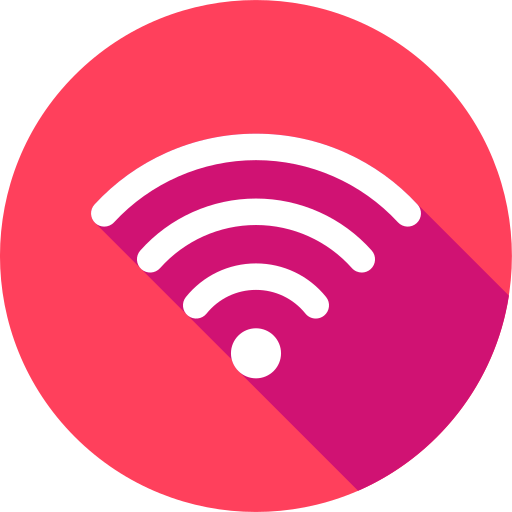
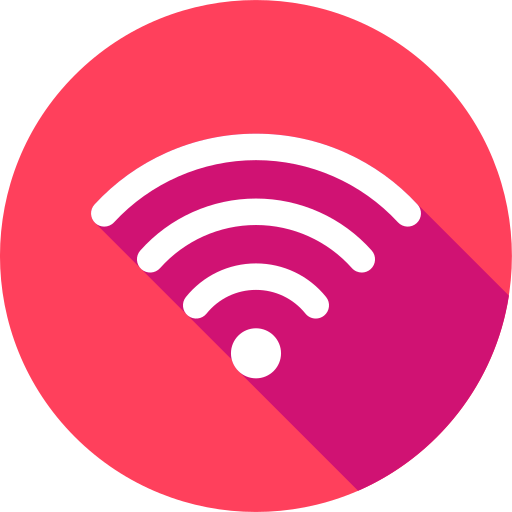
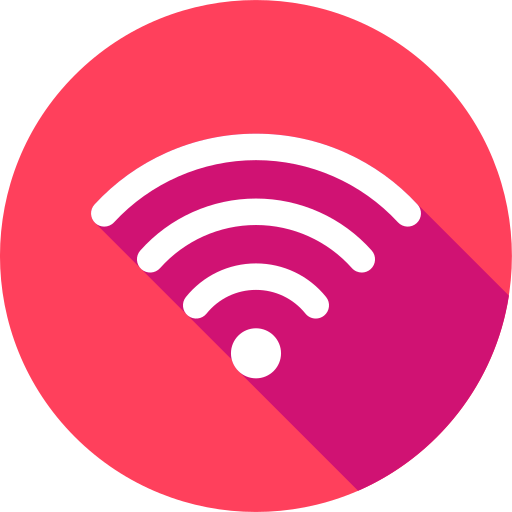
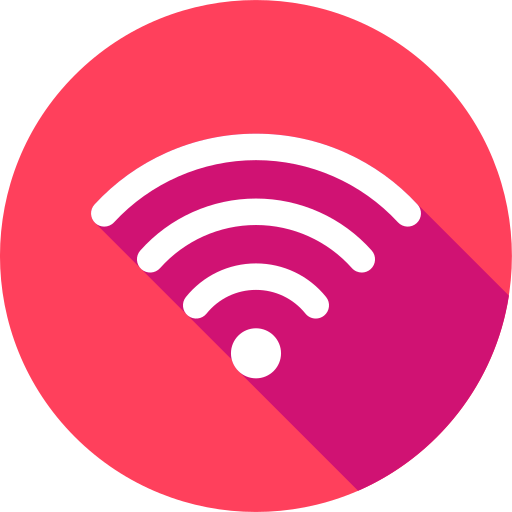
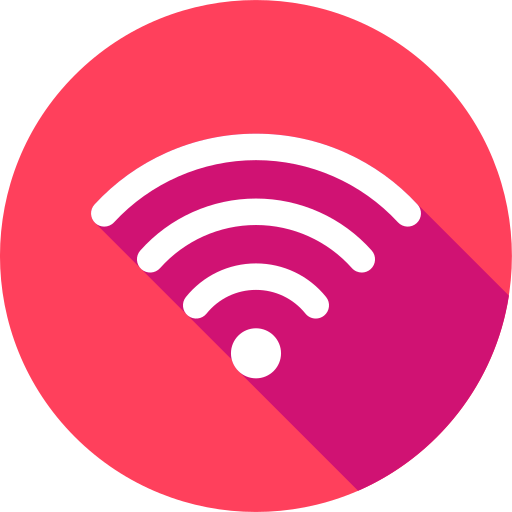
...
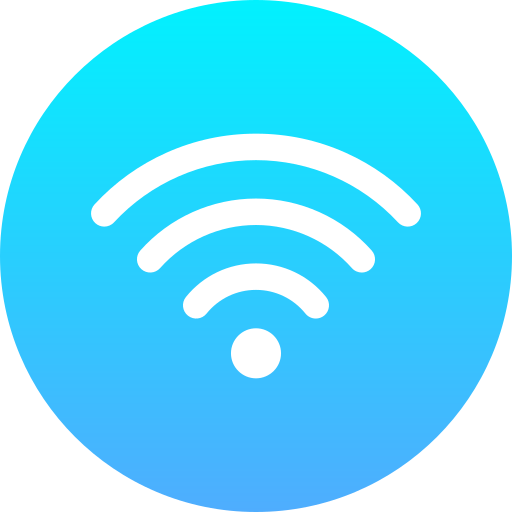
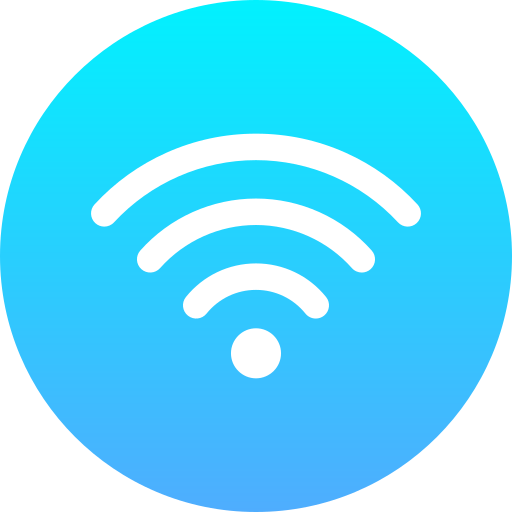
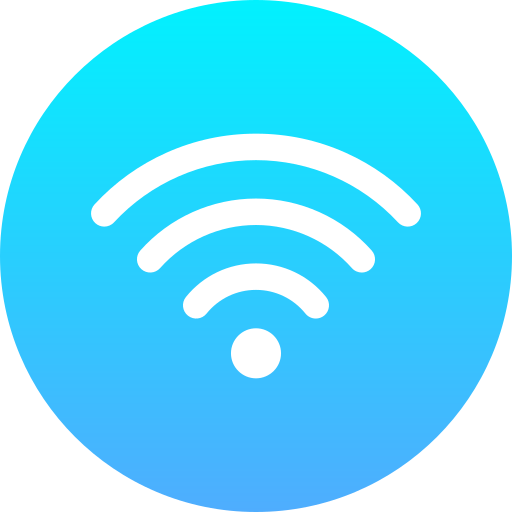
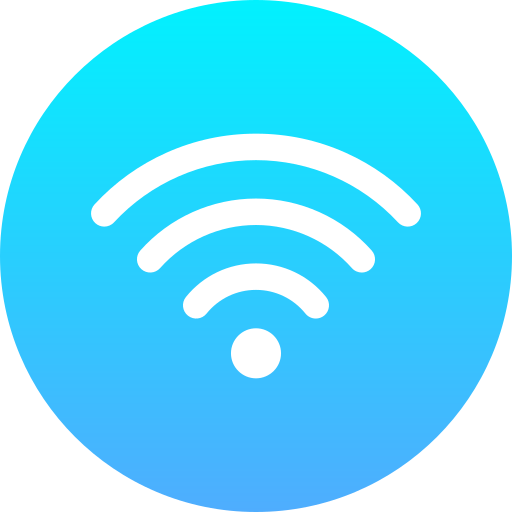
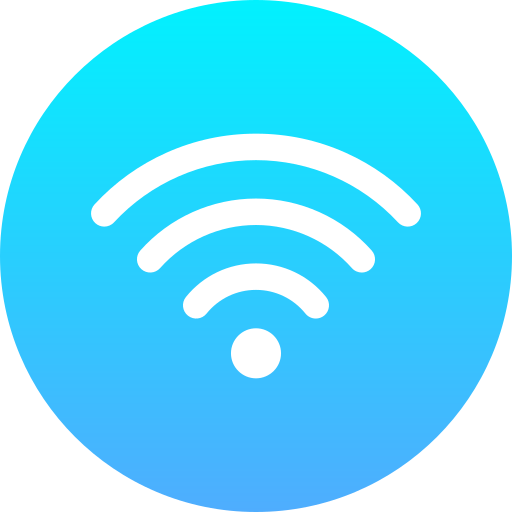

In [9]:
m = folium.Map(location=[19.368519020365436, -99.13702028298755], zoom_start=11, tiles=None)

# Add layer and set light as default mode
folium.TileLayer(tiles="CartoDB Positron", name="Locaciones con WiFi gratuito en Ciudad de México", attr= '''
            &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> 
            contributors &copy; <a href="https://carto.com/attributions">CARTO</a>''').add_to(m)

# Add a groups
g0 = FeatureGroup(name="Centros de Salud")
g0.add_to(m)
g1 = FeatureGroup(name="Pilares")
g1.add_to(m)
g2 = FeatureGroup(name="Sitios Públicos")
g2.add_to(m)
groups = [g0, g1, g2]

# Add the option to switch layers
folium.LayerControl('topright', collapsed= False).add_to(m)

# Add fullscreen option
plugins.Fullscreen(
    position="topright",
    title="Fullscreen",
    title_cancel="Exit fullscreen",
    force_separate_button=True,
).add_to(m)

for i in range(len(dfs)):
    # Iter a dataframe rows
    for j, r in dfs[i].iterrows():
        # Custom icon image
        icon = CustomIcon(f'../assets/icons/wifi{i}.png', 
        icon_size=(30, 30),
        icon_anchor=(20, 10),
        popup_anchor=(-2, -15))
        # Add markers
        folium.Marker([r['Latitud'], r['Longitud']],
        popup = folium.Popup('''
                            <div class="container">
                                Puntos de acceso: {}
                            </div>
                            
                            <style type='text/css'>
                            .container {{
                                width: 150px;
                                font-family: Verdana, sans-serif;
                                text-align:justify;
                                font-size:12px;
                                font-weight: 600; 
                                border-radius: 5px;
                                padding: 10px;
                            }}
                            '''.format(r["Puntos_de_acceso"])),
        tooltip = r['Colonia'],
        icon = icon
        ).add_to(groups[i])

# Save map as 'html'
m.save("../index.html")

# Show map
m